In [50]:
import pickle
import pandas as pd
import gensim
import csv
import random

In [5]:
with open('../../data/tensor3.pkl', 'rb') as f:
    data = pickle.load(f)

In [3]:
data


D00290.003_SELEX_ALX3  D00292.001_SELEX_ALX4  \
100007_raw 1-0                  0.233633              -0.009496   
           1-1                 -0.258342               0.029549   
           1-10                46.199988               3.475145   
           1-100               60.051663              29.272099   
           1-1000              -2.685523             -14.813843   
           1-1001               4.705516              -4.780305   
           1-1002             -13.771291             -11.619157   
           1-1003              20.214893              -3.467312   
           1-1004              -4.244517              -2.570786   
           1-1005               0.366445              -3.491856   
           1-1006               9.011455              -1.103790   
           1-1007               8.499811              -1.974816   
           1-1008             -10.992522              14.601011   
           1-1009               7.340064               7.593170   
           1-101               -9.906465             -14.264758   
           1-1010              -0.754833               5.334964   
           1-1011               3.534911               2.262487   
           1-1012              -0.543469              -3.467030   
           1-1013              10.209665              12.702922   
           1-1014              -7.313896              -4.764818   
           1-1015              -7.532110             -10.523312   
           1-1016             -14.359990              -1.300698   
           1-1017              -4.872284             -14.158611   
           1-1018              14.344668               4.876861   
           1-1019               1.512960               1.109143   
           1-102               -7.038123              -2.424674   
           1-1020              -9.856186             -12.745503   
           1-1021             -24.624511              -2.227445   
           1-1022             -27.969493               4.200149   
           1-1023               2.257808               6.001280   
...                                  ...                    ...   
757_irnt   1-972                0.647797              -5.871198   
           1-973               25.004408               4.373124   
           1-974              -17.571871               2.570175   
           1-975                3.541156               7.600391   
           1-976               -4.398430              10.233435   
           1-977               -0.653355              -4.477253   
           1-978              -18.002176             -18.290009   
           1-979              -20.552192              42.432979   
           1-98                -4.576515              -5.417648   
           1-980               19.539144              20.042327   
           1-981               -0.794316              14.488653   
           1-982               10.200321             -35.412684   
           1-983               28.786365              -6.123262   
           1-984               90.977924             -27.430215   
           1-985               20.879767               1.830986   
           1-986                3.014047              12.666719   
           1-987               -6.549366               0.629852   
           1-988               -0.527058               4.274955   
           1-989                1.748537              -1.750331   
           1-99                -7.788918              -7.611569   
           1-990               -2.868851              -0.182491   
           1-991               -5.938324               2.493521   
           1-992              -15.769198               2.132362   
           1-993               36.513615              41.116373   
           1-994               -6.268132              -2.855267   
           1-995              -18.286816              -7.105736   
           1-996               10.212257               7.599330   
           1-997                5.432915               6.404061   

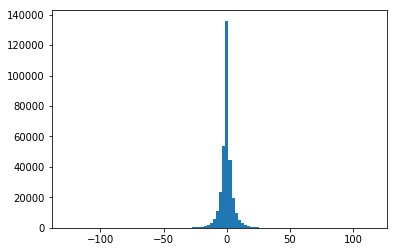

In [24]:
import matplotlib.pyplot as plt
import numpy as np
blah = np.array(data['D00298.003_SELEX_ATF4'])
blah
plt.hist(blah, bins=100)
plt.show()


In [6]:
code_mapper = {}
with open('../../data/gwas_names.csv', 'r') as f:
    reader = csv.reader(f)
    for row in reader:
        code = row[0]
        name = row[1]
        code_mapper[code] = name

In [9]:
thresh = 30
documents = {}
for index, row in data.iterrows():
    disease, location = index
    for tf, score in row.iteritems():
        if abs(score) > thresh:
            disease_name = code_mapper.get(disease, disease)
            doc_key = str(location)
            word_key = str((disease_name, tf))
            if doc_key not in documents:
                documents[doc_key] = []
            documents[doc_key].append(word_key)
    

In [90]:
keys = sorted(documents.keys(), key=lambda a: int(a.split('-')[1]))


['1-6', '1-7', '1-8', '1-9', '1-10', '1-11', '1-12', '1-13', '1-14', '1-15', '1-16', '1-17', '1-18', '1-19', '1-20', '1-21', '1-22', '1-23', '1-24', '1-25', '1-26', '1-27', '1-28', '1-29', '1-30', '1-31', '1-32', '1-33', '1-34', '1-35', '1-36', '1-37', '1-38', '1-39', '1-40', '1-41', '1-42', '1-43', '1-44', '1-45', '1-46', '1-47', '1-48', '1-49', '1-50', '1-51', '1-52', '1-53', '1-54', '1-55', '1-56', '1-57', '1-58', '1-59', '1-60', '1-61', '1-62', '1-63', '1-64', '1-65', '1-66', '1-67', '1-68', '1-69', '1-70', '1-71', '1-72', '1-73', '1-74', '1-75', '1-76', '1-77', '1-78', '1-79', '1-80', '1-81', '1-82', '1-83', '1-84', '1-85', '1-86', '1-87', '1-88', '1-89', '1-90', '1-91', '1-92', '1-93', '1-94', '1-95', '1-96', '1-97', '1-98', '1-99', '1-100', '1-101', '1-102', '1-103', '1-104', '1-105', '1-106', '1-107', '1-108', '1-109', '1-110', '1-111', '1-112', '1-113', '1-114', '1-115', '1-116', '1-117', '1-118', '1-119', '1-120', '1-121', '1-122', '1-123', '1-124', '1-125', '1-126', '1-127',

In [94]:
cmp = lambda kv: int(kv[0].split('-')[1])
dct = gensim.corpora.Dictionary(documents.values())
kvs = list(documents.items())
random.shuffle(kvs)
kvs_test = kvs[:len(kvs) // 10]
kvs_train = kvs[len(kvs) // 10:]
kvs.sort(key=cmp)
kvs_train.sort(key=cmp)
kvs_test.sort(key=cmp)
corpus = [dct.doc2bow(text) for key, text in kvs]
corpus_train = [dct.doc2bow(text) for key, text in kvs_train]
corpus_test = [dct.doc2bow(text) for key, text in kvs_test]

genomic_locations = [cmp(kv) for kv in kvs]
print(genomic_locations)

[6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 131, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 23

In [96]:
num_topics = 10
lda = gensim.models.LdaModel(corpus, num_topics=num_topics, id2word=dct)

In [79]:
best_model = None
best_perplex = float('inf')
for num_topics in range(1, 101, 5):
    lda = gensim.models.LdaModel(corpus_train, num_topics=num_topics, id2word=dct)
    perplex = lda.log_perplexity(corpus_test)
    print(num_topics, perplex)
    
    if perplex < best_perplex:
        best_model = lda
        best_perplex = perplex

1 -10.695703710118467
6 -11.61940196182688
11 -12.672885283421936
16 -13.796571240361802
21 -14.965822468177173
26 -16.169218611972084
31 -17.395497106324147
36 -18.643800063077347


KeyboardInterrupt: 

In [19]:
for idx, topic in lda.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))

Topic: 0 Word: 0.000*"(' Haemoglobin concentration', 'D00650.005_SELEX_SP1')" + 0.000*"('Basal metabolic rate', 'D00571.002_SELEX_PAX2')" + 0.000*"('Lifetime number of sexual partners', 'D00571.002_SELEX_PAX2')" + 0.000*"(' Weight', 'D00571.002_SELEX_PAX2')" + 0.000*"('Pulse rate- automated reading', 'D00571.002_SELEX_PAX2')" + 0.000*"('Alcohol intake frequency.', 'D00650.005_SELEX_SP1')" + 0.000*"('Body fat percentage', 'D00571.002_SELEX_PAX2')" + 0.000*"('Non-cancer illness code- self-reported: tuberculosis (tb)', 'D00571.002_SELEX_PAX2')" + 0.000*"('Miserableness', 'D00571.002_SELEX_PAX2')" + 0.000*"('Non-cancer illness code- self-reported: asthma', 'D00571.002_SELEX_PAX2')"
Topic: 1 Word: 0.000*"(' Weight', 'D00571.002_SELEX_PAX2')" + 0.000*"(' Weight', 'D00650.005_SELEX_SP1')" + 0.000*"('Mean time to correctly identify matches', 'D00571.002_SELEX_PAX2')" + 0.000*"('Non-cancer illness code- self-reported: hypertension', 'D00571.002_SELEX_PAX2')" + 0.000*"('Lifetime number of sexual

In [82]:
enhancers = []
with open('../../data/enhancers.tsv', 'r') as f:
    skip = True
    for line in f:
        if skip:
            skip = False
            continue
        tokens = line.split()
        start = tokens[2]
        end = tokens[3]
        binn = tokens[0]
        if int(binn) <8:
            continue
        
        if 'enh' in tokens[4].lower():
            enhancers.append(int(start)//100000)
            
enhancers = sorted(enhancers)
enhancers
        
        

[14,
 86,
 96,
 99,
 186,
 222,
 254,
 277,
 289,
 349,
 368,
 399,
 418,
 423,
 443,
 462,
 524,
 643,
 668,
 850,
 853,
 888,
 914,
 945,
 1017,
 1018,
 1097,
 1116,
 1121,
 1142,
 1156,
 1166,
 1170,
 1551,
 1599,
 1606,
 1608,
 1675,
 1686,
 1723,
 1735,
 1752,
 1810,
 1825,
 1862,
 1925,
 2002,
 2027,
 2032,
 2034,
 2063,
 2068,
 2098,
 2124,
 2221,
 2268,
 2347,
 2350,
 2351,
 2354,
 2451,
 2461]

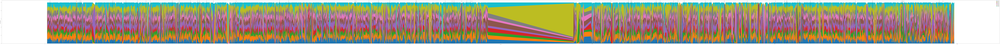

In [100]:
import matplotlib.pyplot as plt
import numpy as np

start = 0
ncorpus = len(corpus)
dists = np.zeros((num_topics, ncorpus))

for i, document in enumerate(corpus[start : start + ncorpus]):
    dist = lda[document]
    for topic, percentage in dist:
        dists[topic, i] = percentage


plt.figure(figsize=(450,20))
plt.xlabel('location')
plt.ylabel('topic distribution')
label_array = ["cluster " + str(i) for i in range(num_topics)]
for xc in enhancers:
    plt.axvline(x=xc, color='black')

plt.stackplot(genomic_locations, dists, labels=label_array)
plt.legend()
plt.show()